<a id = 'top'></a>

[Configure Notebook](#configure)  
***

# Cross-trial aligment checks by cell  
Here we track changes in the correlation structure of each ROI in reference channel. 

We find a representative trial where we know the cell is well represented by its mask. We then assume that any FOV displacement will cause the local neighborhood around the mask to shift uniformly. If the cell doesn’t move under the mask, then we should be able to reliably identify it in the local neighborhood across the experiment. To quantify displacement, we can cross correlate the small representative mask to its larger neighborhood across time.  Periods where the displacement between correlation peaks is greater than half the mask diameter can be isolated and excluded.
****
 
[Visualize trial-odor-cell local neighborhood correlation structure](#loop)
>[Set paths](#paths)  
>[Load data](#load)  
>[Plot cell-trial-odor corr neighborhoods](#routine)  
>[Debug](#debug)  
>[Support](#support)

[Perform FNCC on local cell neighborhoods](#FNCC)
>[Singe run](#singe run)  
>[Loop](#FNCCloop)    
>[Plot responses](#responses)   
>[roi area](#roi area)  
>[Plot Displacement](#plot displacement)  
>[FNCC function](#FNCCroutine)  
>[Debug](#FNCCdebug)  



<a id = 'paths'></a>
## Set paths
[back to top](#top)

In [598]:
experiment = 'sp112315a'
odorPath = '/Users/Stan/Desktop/sp112315a_h5/traces/odorInfo.dat'
maskPath = '/Users/Stan/Desktop/sp112315a_h5/sp112315a_mask.dat'
qcGitDir = '/Users/Stan/Documents/myPiriform/notebooks/qc/sp112315a/'
sframePath = '/Users/Stan/Desktop/sp112315a_h5/traces/sp112315a_processed'
rawTraces_e1_Path = '/Users/Stan/Desktop/sp112315a_h5/traces/tracesDicts/e1_traces_dict.dat'
rawTraces_e2_Path = '/Users/Stan/Desktop/sp112315a_h5/traces/tracesDicts/e2_traces_dict.dat'
workflowDict_e1_Path = '/Users/Stan/Desktop/sp112315a_h5/traces/tracesDicts/workflow_dict_e1.dat'
workflowDict_e2_Path = '/Users/Stan/Desktop/sp112315a_h5/traces/tracesDicts/workflow_dict_e2.dat'
h5FnamesDir = '/Users/Stan/Desktop/sp112315a_h5/red/'
responsePath = '/Users/Stan/Desktop/responses_forAlignmentChecks.h5'


<a id = 'load'></a>
## Load data
[back to top](#top)


In [4]:

sframe = gl.SFrame(sframePath)
fname = '/Users/Stan/Desktop/sp112315a_h5/red/_e2_013_concatenated.h5'
mask = pickle.load(open(maskPath))
odorInfo = pickle.load(open(odorPath))

<a id = 'loop'></a>
## Loop 

[back to top](#top)


In [904]:
fnames = glob(h5FnamesDir+'*.h5')

In [906]:
[int(_) for _ in re.split('_e|_con|_',fname)[-3:-1]]  

[1, 11]

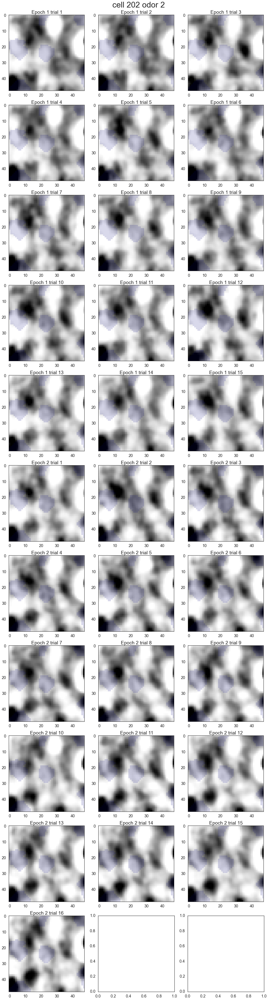

In [919]:
savePath = '/users/stan/desktop/corrPlots/intensitybyTrial_cell_{}.png'.format(cell)
plot_locNeigh(h5Fnames=fnames, mask=mask, odorInfo=odorInfo, odorID=2,
                           cellID=cell, savePath = savePath,key = 'current_statestep2/corrected' )

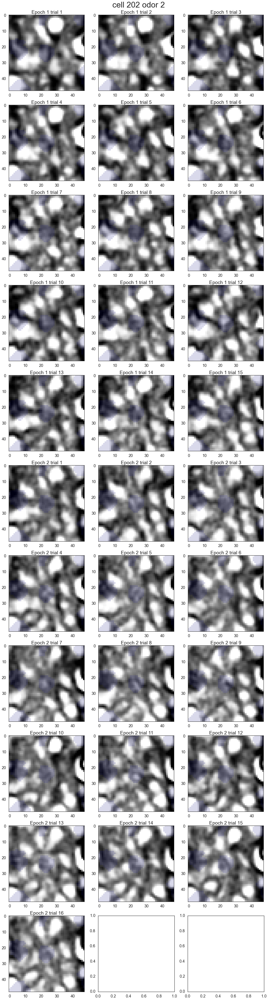

In [913]:
plot_corr_locNeigh(h5Fnames=fnames, mask=mask, odorInfo=odorInfo, odorID=2,
                           cellID=cell, savePath = savePath,key = 'current_statestep2/corrected' )

In [ ]:
for cell in range(202,203):
    try:
        savePath = '/users/stan/desktop/corrPlots/corrbyTrial_cell_{}.png'.format(cell)
        plot_corr_locNeigh(h5Fnames=fnames, mask=mask, odorInfo=odorInfo, odorID=2,
                           cellID=cell, savePath = savePath,key = 'current_statestep2/corrected' )
        plt.close()
    except:
        print cell, fname
        pass


<a id = 'routine'></a>
## Define routine

[back to top](#top)

In [918]:
def plot_locNeigh(h5Fnames, mask, odorInfo, odorID, cellID, savePath, key = 'current_statestep2/corrected'):
    import re
    import h5py
    import matplotlib.pylab as plt
    from sklearn.preprocessing import scale
    #Display 
    cell = cellID
    odor = odorID
    
    numRows =len(h5Fnames)/3+1
    numCols =3
        
    fig,ax = plt.subplots(numRows,numCols, figsize = (15, 5*numRows))
    fig.text(0.42,1,'cell {} odor {}'.format(cell, odor), fontsize = 32)
    
    row = 0
    column=0    
    for i,fname in enumerate(h5Fnames):

        if i > 0:
            if np.remainder(i,3)==0:
                row+=1
                column=0
            elif np.remainder(i,3)!=0:
                column+=1

        epoch,trialID = [int(_) for _ in re.split('_e|_con|_',fname)[-3:-1]]        
        odorFrames_i, odorFrames_f = odorInfo['epoch{}'.format(epoch)][trialID-1]['pre_odor_post_interval'][odor]

        # get coords
        from scipy.ndimage.measurements import center_of_mass as get_coords
        a,b = scipy.ndimage.label(mask)
        coords = get_coords(mask, a, range(b+1))
        coords = [(t[1],t[0]) for t in coords]

        #Make Mask Overlay
        overlay = np.ma.MaskedArray(mask.astype(bool), np.invert(mask.astype(bool)).astype(bool))
        #Specify dimensions and location of zoom window around cell mask
        halfRad = 25
        yi = (coords[cell][1]-halfRad).astype(int)
        yf = (coords[cell][1]+halfRad).astype(int)
        xi = (coords[cell][0]-halfRad).astype(int)
        xf = (coords[cell][0]+halfRad).astype(int)

        with h5py.File(fname, 'r+', ) as f:

            stack = f[key][yi:yf,xi:xf, odorFrames_i:odorFrames_f ].mean(2)

#        h,w,numFrames = stack.shape
#         corrWin = 2
#         #scale each frame
#         scaled = np.empty((h,w,numFrames))
#         for i, frame in enumerate([scale(stack[...,frame]) for frame in range(numFrames)]):
#             scaled[...,i] = frame
#         #Correlate    
#         recover = np.empty((h,w))
#         for i in range(0,h):
#             for j in range(0,w):
#                 recover[i,j] = np.correlate(scaled[i,j,:],scaled[i-corrWin:i+corrWin, j-corrWin:j+corrWin,:].mean(0).mean(0))


        from scipy.stats.mstats import mquantiles
        cmin,cmax = mquantiles(stack[corrWin:,corrWin:].flatten(),  prob=[0.02, .9])

        #plt.figure(figsize = (5,5))



        ax[row,column].imshow(stack[corrWin:,corrWin:],vmin = cmin, vmax = cmax,cmap = 'Greys_r')
        ax[row,column].set_title('Epoch {} trial {}'.format(epoch,trialID))
        ax[row,column].imshow(overlay[yi:yf,xi:xf][corrWin:,corrWin:], cmap = 'jet', alpha = 0.15)
        fig.tight_layout()
    plt.savefig(savePath)
        

In [912]:
def plot_corr_locNeigh(h5Fnames, mask, odorInfo, odorID, cellID, savePath, key = 'current_statestep2/corrected'):
    import re
    import h5py
    import matplotlib.pylab as plt
    from sklearn.preprocessing import scale
    #Display 
    cell = cellID
    odor = odorID
    
    numRows =len(h5Fnames)/3+1
    numCols =3
        
    fig,ax = plt.subplots(numRows,numCols, figsize = (15, 5*numRows))
    fig.text(0.42,1,'cell {} odor {}'.format(cell, odor), fontsize = 32)
    
    row = 0
    column=0    
    for i,fname in enumerate(h5Fnames):

        if i > 0:
            if np.remainder(i,3)==0:
                row+=1
                column=0
            elif np.remainder(i,3)!=0:
                column+=1

        epoch,trialID = [int(_) for _ in re.split('_e|_con|_',fname)[-3:-1]]        
        odorFrames_i, odorFrames_f = odorInfo['epoch{}'.format(epoch)][trialID-1]['pre_odor_post_interval'][odor]

        # get coords
        from scipy.ndimage.measurements import center_of_mass as get_coords
        a,b = scipy.ndimage.label(mask)
        coords = get_coords(mask, a, range(b+1))
        coords = [(t[1],t[0]) for t in coords]

        #Make Mask Overlay
        overlay = np.ma.MaskedArray(mask.astype(bool), np.invert(mask.astype(bool)).astype(bool))
        #Specify dimensions and location of zoom window around cell mask
        halfRad = 25
        yi = (coords[cell][1]-halfRad).astype(int)
        yf = (coords[cell][1]+halfRad).astype(int)
        xi = (coords[cell][0]-halfRad).astype(int)
        xf = (coords[cell][0]+halfRad).astype(int)

        with h5py.File(fname, 'r+', ) as f:

            stack = f[key][yi:yf,xi:xf, odorFrames_i:odorFrames_f ]

        h,w,numFrames = stack.shape
        corrWin = 2
        #scale each frame
        scaled = np.empty((h,w,numFrames))
        for i, frame in enumerate([scale(stack[...,frame]) for frame in range(numFrames)]):
            scaled[...,i] = frame
        #Correlate    
        recover = np.empty((h,w))
        for i in range(0,h):
            for j in range(0,w):
                recover[i,j] = np.correlate(scaled[i,j,:],scaled[i-corrWin:i+corrWin, j-corrWin:j+corrWin,:].mean(0).mean(0))


        from scipy.stats.mstats import mquantiles
        cmin,cmax = mquantiles(recover[corrWin:,corrWin:].flatten(),  prob=[0.02, .9])

        #plt.figure(figsize = (5,5))



        ax[row,column].imshow(recover[corrWin:,corrWin:],vmin = cmin, vmax = cmax,cmap = 'Greys_r')
        ax[row,column].set_title('Epoch {} trial {}'.format(epoch,trialID))
        ax[row,column].imshow(overlay[yi:yf,xi:xf][corrWin:,corrWin:], cmap = 'jet', alpha = 0.15)
        fig.tight_layout()
    plt.savefig(savePath)
        

<a id = 'debug'></a>
## Debugging

[back to top](#top)

In [ ]:
#Display 
numRows =len(fnames)/3
numCols =3

fig,ax = plt.subplots(numRows,numCols,figsize = (15,5))
fig.text(0.46,1,'cell {}'.format(cell), fontsize = 32)
for i,fname in enumerate(fnames):
    subplot = i
    epoch,trialID = [int(_) for _ in re.split('_e|_con|_',fname)[-3:-1]]
    odor = 3
    odorFrames_i, odorFrames_f = odorInfo['epoch{}'.format(epoch)][trialID-1]['pre_odor_post_interval'][odor]
    
    cell = 202
    #Specify dimensions and location of zoom window around cell mask
    halfRad = 25
    yi = (coords[cell][1]-halfRad).astype(int)
    yf = (coords[cell][1]+halfRad).astype(int)
    xi = (coords[cell][0]-halfRad).astype(int)
    xf = (coords[cell][0]+halfRad).astype(int)

    with h5py.File(fname, 'r+', ) as f:

        stack = f['current_statestep2/corrected'][yi:yf,xi:xf, odorFrames_i:odorFrames_f ]
    
    h,w,numFrames = stack.shape
    corrWin = 2
    #scale each frame
    scaled = np.empty((h,w,numFrames))
    for i, frame in enumerate([sklearn.preprocessing.scale(stack[...,frame]) for frame in range(numFrames)]):
        scaled[...,i] = frame
    #Correlate    
    recover = np.empty((h,w))
    for i in range(0,h):
        for j in range(0,w):
            recover[i,j] = np.correlate(scaled[i,j,:],scaled[i-corrWin:i+corrWin, j-corrWin:j+corrWin,:].mean(0).mean(0))
            
    
    from scipy.stats.mstats import mquantiles
    cmin,cmax = mquantiles(recover[corrWin:,corrWin:].flatten(),  prob=[0.02, .9])

    #plt.figure(figsize = (5,5))



    ax[subplot].imshow(recover[corrWin:,corrWin:],vmin = cmin, vmax = cmax,cmap = 'Greys_r')
    ax[subplot].set_title('Epoch {} trial {}'.format(epoch,trialID))
    ax[subplot].imshow(overlay[yi:yf,xi:xf][corrWin:,corrWin:], cmap = 'jet', alpha = 0.15)
       

### Get cell coordinates from mask

In [523]:
from scipy.ndimage.measurements import center_of_mass as get_coords
a,b = scipy.ndimage.label(mask)
coords = get_coords(mask, a, range(b+1))
coords = [(t[1],t[0]) for t in coords]

#Make Mask Overlay
overlay = np.ma.MaskedArray(mask.astype(bool), np.invert(mask.astype(bool)).astype(bool))

### Get odor-trial-frames

In [592]:
epoch,trialID = [int(_) for _ in re.split('_e|_con|_',fname)[-3:-1]]
odor = 3

odorFrames_i, odorFrames_f = odorInfo['epoch{}'.format(epoch)][trialID-1]['pre_odor_post_interval'][odor]

### Load Neighborhood

In [595]:
cell = 202
#Specify dimensions and location of zoom window around cell mask
halfRad = 25
yi = (coords[cell][1]-halfRad).astype(int)
yf = (coords[cell][1]+halfRad).astype(int)
xi = (coords[cell][0]-halfRad).astype(int)
xf = (coords[cell][0]+halfRad).astype(int)

with h5py.File(fname, 'r+', ) as f:
    
    stack = f['current_statestep2/corrected'][yi:yf,xi:xf, odorFrames_i:odorFrames_f ]

### Correlate

In [596]:
h,w,numFrames = stack.shape
corrWin = 2
#scale each frame
scaled = np.empty((h,w,numFrames))
for i, frame in enumerate([sklearn.preprocessing.scale(stack[...,frame]) for frame in range(numFrames)]):
    scaled[...,i] = frame
#Correlate    
recover = np.empty((h,w))
for i in range(0,h):
    for j in range(0,w):
        recover[i,j] = np.correlate(scaled[i,j,:],scaled[i-corrWin:i+corrWin, j-corrWin:j+corrWin,:].mean(0).mean(0))
       

/Users/Stan/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype uint8 was converted to float64 by the scale function.
  warnings.warn(msg, DataConversionWarning)
/Users/Stan/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype uint8 was converted to float64 by the scale function.
  warnings.warn(msg, DataConversionWarning)
/Users/Stan/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype uint8 was converted to float64 by the scale function.
  warnings.warn(msg, DataConversionWarning)
/Users/Stan/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype uint8 was converted to float64 by the scale function.
  warnings.warn(msg, DataConversionWarning)
/Users/Stan/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarn

### Display

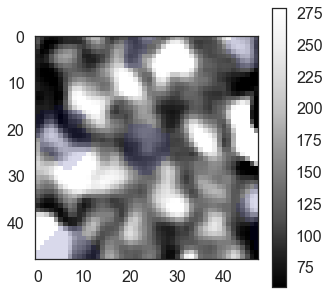

In [597]:

from scipy.stats.mstats import mquantiles
cmin,cmax = mquantiles(recover[corrWin:,corrWin:].flatten(),  prob=[0.02, .9])

plt.figure(figsize = (5,5))
plt.imshow(recover[corrWin:,corrWin:],vmin = cmin, vmax = cmax,cmap = 'Greys_r')
plt.colorbar()
plt.imshow(overlay[yi:yf,xi:xf][corrWin:,corrWin:], cmap = 'jet', alpha = 0.15)

<a id = 'support'></a>
# Support

[back to top](#top)


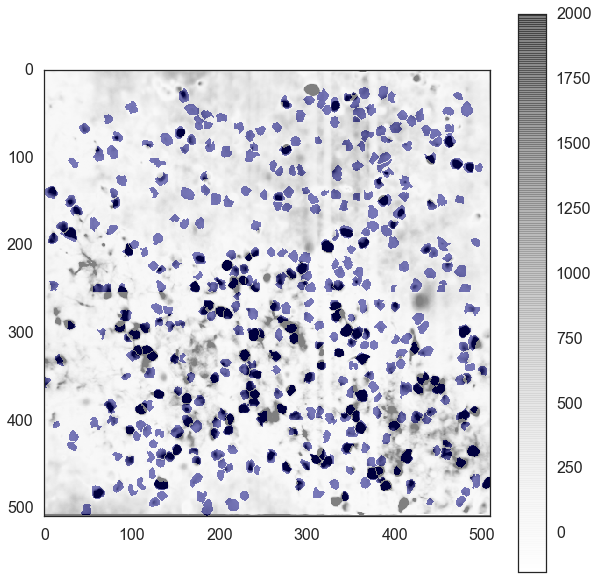

In [492]:
plt.figure(figsize = (10,10))
plt.imshow(overlay[2:,2:], cmap = 'jet', alpha = 1)
plt.imshow(recover[2:,2:],vmin = -150,vmax = 2000, alpha = 0.5)
plt.colorbar()

plt.savefig('/users/stan/desktop/triale2_12green.png')

<a id = 'FNCC'></a>
# FNCC


[back to top](#top) 




For a single target trial, perform FNCC to all other trials, obtain correlation coefficient and peak position  


<a id = 'singe run'></a>
## Single run-through

In [19]:
from skimage.feature import match_template

In [1043]:
fnames = glob(h5FnamesDir + '*.h5')

fname = fnames[20]

targetFname = fnames[0]

In [1044]:
fname

'/Users/Stan/Desktop/sp112315a_h5/red/_e2_006_concatenated.h5'

In [1052]:
from scipy.ndimage.measurements import center_of_mass as get_coords

odor = 2
cell = 202
epoch,trialID = [int(_) for _ in re.split('_e|_con|_',fname)[-3:-1]]

a,b = scipy.ndimage.label(mask)
coords = get_coords(mask, a, range(b+1))
coords = [(t[1],t[0]) for t in coords]

#Make Mask Overlay
overlay = np.ma.MaskedArray(mask.astype(bool), np.invert(mask.astype(bool)).astype(bool))

#get odor Info
odorFrames_i, odorFrames_f = odorInfo['epoch{}'.format(epoch)][trialID-1]['pre_odor_post_interval'][odor]

#Load neighborhood

#Specify dimensions and location of zoom window around cell mask
halfRad = 25
yi = (coords[cell][1]-halfRad).astype(int)
yf = (coords[cell][1]+halfRad).astype(int)
xi = (coords[cell][0]-halfRad).astype(int)
xf = (coords[cell][0]+halfRad).astype(int)
with h5py.File(targetFname, 'r+', ) as f:    
    target = f['current_statestep1/corrected'][yi:yf,xi:xf, odorFrames_i:odorFrames_f]    

with h5py.File(fname, 'r+', ) as f:    
    trial = f['current_statestep1/corrected'][yi:yf,xi:xf, odorFrames_i:odorFrames_f]

In [1053]:
trial = trial.mean(2)

trial = trial[:,:,np.newaxis]

target = target.mean(2)

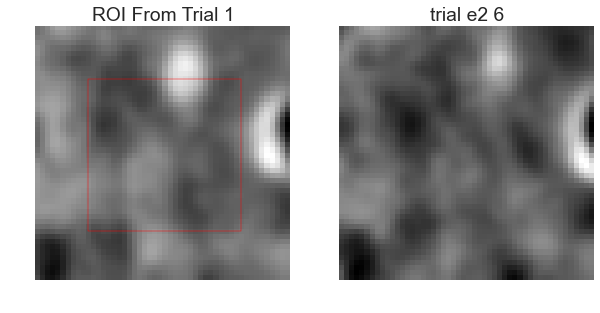

In [1054]:

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 5))
ax2.imshow(trial[...,0], cmap = 'gray')
ax2.set_axis_off()
ax2.set_title('trial e2 6')

ax1.imshow(target[...], cmap = 'gray')
ax1.set_axis_off()
ax1.set_title('ROI From Trial 1')

# Plot Rectangle to highlight template size These also serve as the target coordinates
xstart = 10
ystart = 10
targetW = 30
targetH = 30

rect = plt.Rectangle((xstart, ystart), targetW, targetH, edgecolor='r', facecolor='none')
plot = ax1.add_patch(rect)


In the image above, the red square of our representative trial for this cell is used to search the all other trials, like the sample shown. 

In [1055]:
ref_subimage = target[xstart:xstart+targetW, ystart:ystart+targetH]
ref_subimage = ref_subimage[:,:,np.newaxis]

The returned Coordinates indicate the upper left hand corner of the target square which we initially defined to be at 10,10 of our 50x50 pixel neighborhood. So displacement should always be calculated as x,y - 10,10

In [1056]:
#Execute Fast normalized cross-correlation
result = match_template(trial, ref_subimage)

scores = []
argmax_coords = []

#Obtain correlation values
for frame in range(result.shape[2]):
    single_frame_result = result[:,:,frame]
    single_frame_maximum = np.argmax(single_frame_result)
    ijk = np.unravel_index(single_frame_maximum,single_frame_result.shape)
    scores.append(single_frame_result[ijk])
    argmax_coords.append(ijk)

### Display Peak

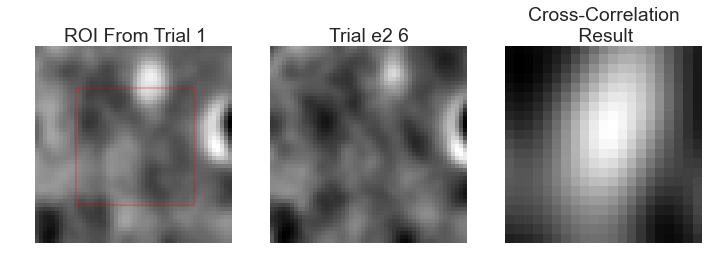

In [1057]:

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(10, 5))
ax2.imshow(trial[...,0], cmap = 'gray')
ax2.set_axis_off()
ax2.set_title('Trial e2 6')

ax1.imshow(target[:,:], cmap = 'gray')
ax1.set_axis_off()
ax1.set_title('ROI From Trial 1')

# Plot Rectangle to highlight template size These also serve as the target coordinates
xstart = 10
ystart = 10
targetW = 30
targetH = 30

rect = plt.Rectangle((xstart, ystart), targetW, targetH, edgecolor='r', facecolor='none')
plot = ax1.add_patch(rect)

ax3.imshow(result[:,:, 0], cmap = 'gray')
ax3.set_axis_off()
ax3.set_title('Cross-Correlation \n Result')
# highlight matched region
ax3.autoscale(False)
x,y = argmax_coords[0]
ax3.plot(x, y, markeredgecolor='r', markerfacecolor='none', markersize=10)
fig.tight_layout()
plt.savefig('/users/stan/desktop/corrPlots/unaligned_FNCC_sample_cell202_odor2.png')
plt.show()

In [1058]:
x,y

(8, 11)

In [1059]:
unaligned displacement. 2.23

SyntaxError: invalid syntax (<ipython-input-1059-6285b007d0b7>, line 1)

In [1041]:
from scipy.spatial import distance
distance.pdist(np.array([(10,10),(x,y)]),'euclidean')

array([ 2.23606798])

<a id = 'FNCCloop'></a>
## Now let's loop 
[back to top](#top) 

In [8]:
from skimage.feature import match_template
from scipy.ndimage.measurements import center_of_mass as get_coords

fnames = glob(h5FnamesDir + '*.h5')
targetfname = fnames[0]
numCells = 416

Run on raw intensity

In [521]:
resultsDict  = {}
for cell in range(numCells)[:]:
    scores, argmax_coords, EucDist, AveEucDisplacement = runFNCC(mask, odor=3, cell=cell, 
                                                                 fnames=fnames, targetFname=targetfname,
                                                                 key = 'current_statestep2/corrected')
    
    resultsDict[cell] = dict(scores = scores,
                            argmax_coords = argmax_coords,
                            EucDist = EucDist,
                            AveEucDisplacement = AveEucDisplacement)
    
unAlignedResultsDict  = {}
for cell in range(numCells)[:]:
    scores, argmax_coords, EucDist, AveEucDisplacement = runFNCC(mask, odor=3, 
                                                                 cell=cell, fnames=fnames, targetFname=targetfname,
                                                                 key = 'current_statestep1/corrected')
    
    unAlignedResultsDict[cell] = dict(scores = scores,
                            argmax_coords = argmax_coords,
                            EucDist = EucDist,
                            AveEucDisplacement = AveEucDisplacement)
    

Exception: cell 0, -9223372036854775808  neighborhood outside image
Exception: cell 74, 522  neighborhood outside image
Exception: cell 86, -15  neighborhood outside image
Exception: cell 122, -2  neighborhood outside image
Exception: cell 130, -13  neighborhood outside image
Exception: cell 135, 519  neighborhood outside image
Exception: cell 183, -12  neighborhood outside image
Exception: cell 204, 514  neighborhood outside image
Exception: cell 242, 515  neighborhood outside image
Exception: cell 262, -6  neighborhood outside image
Exception: cell 272, 527  neighborhood outside image
Exception: cell 286, -21  neighborhood outside image
Exception: cell 314, 517  neighborhood outside image
Exception: cell 335, -9  neighborhood outside image
Exception: cell 359, 516  neighborhood outside image
Exception: cell 391, 519  neighborhood outside image
Exception: cell 395, 531  neighborhood outside image
Exception: cell 406, 514  neighborhood outside image
Exception: cell 407, 513  neighborho

Store output in DataFrame

In [522]:

dfAligned = pd.DataFrame(resultsDict).T
dfAligned['aligned']=1

dfUnaligned = pd.DataFrame(unAlignedResultsDict).T
dfUnaligned['aligned']=0

dfRaw = dfAligned.append(dfUnaligned)

In [561]:
np.nan

nan

In [592]:
df = df.replace('exclude', np.nan)
dfRaw = dfRaw.replace('exclude', np.nan)

In [567]:
df['AveEucDisplacementNormed'] = df.apply(lambda x: x.AveEucDisplacement/x.roi_radius, axis = 1)

In [593]:
dfRaw['AveEucDisplacementNormed'] = dfRaw.apply(lambda x: x.AveEucDisplacement/x.roi_radius, axis = 1)

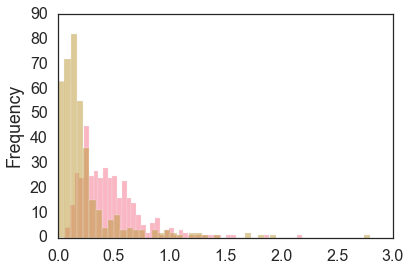

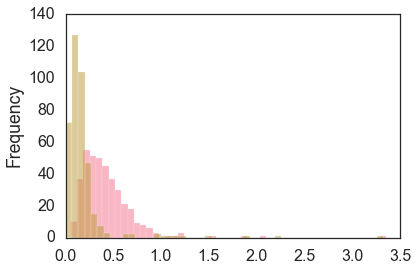

In [594]:
#This is the distribution of cell by cell displacement after normalizing to each cell's radius. before and after alignment
#corr
for aligned in [0,1]:
    df[df.aligned==aligned].AveEucDisplacementNormed.plot.hist(bins = 50, alpha = 0.5)
plt.figure()   
for aligned in [0,1]:
    dfRaw[dfRaw.aligned==aligned].AveEucDisplacementNormed.plot.hist(bins = 50, alpha = 0.5)

<a id = 'roi area'></a>
## Get roi area
[back to top](#top) 

In [514]:
areaList =  []
radiusList = []
for cell in range(416):
    area = len(mask[mask==cell])
    areaList.append(area)
    radiusList.append(np.power(area/np.pi,0.5))

In [523]:
dfRaw['roi_radius'] = pd.Series(radiusList)
dfRaw['roi_area'] = pd.Series(areaList)

Run on correlated version of trial and target

In [356]:
resultsDict  = {}
for cell in range(numCells)[:]:
    scores, argmax_coords, EucDist, AveEucDisplacement = runFNCConCorr(mask, odor=3, cell=cell, 
                                                                 fnames=fnames, targetFname=targetfname,
                                                                 key = 'current_statestep2/corrected')
    
    resultsDict[cell] = dict(scores = scores,
                            argmax_coords = argmax_coords,
                            EucDist = EucDist,
                            AveEucDisplacement = AveEucDisplacement)
    
unAlignedResultsDict  = {}
for cell in range(numCells)[:]:
    scores, argmax_coords, EucDist, AveEucDisplacement = runFNCConCorr(mask, odor=3, 
                                                                 cell=cell, fnames=fnames, targetFname=targetfname,
                                                                 key = 'current_statestep1/corrected')
    
    unAlignedResultsDict[cell] = dict(scores = scores,
                            argmax_coords = argmax_coords,
                            EucDist = EucDist,
                            AveEucDisplacement = AveEucDisplacement)
    

Exception: cell 0, -9223372036854775808  neighborhood outside image
Exception: cell 74, 522  neighborhood outside image
Exception: cell 86, -15  neighborhood outside image
Exception: cell 122, -2  neighborhood outside image
Exception: cell 130, -13  neighborhood outside image
Exception: cell 135, 519  neighborhood outside image
Exception: cell 183, -12  neighborhood outside image
Exception: cell 204, 514  neighborhood outside image
Exception: cell 242, 515  neighborhood outside image
Exception: cell 262, -6  neighborhood outside image
Exception: cell 272, 527  neighborhood outside image
Exception: cell 286, -21  neighborhood outside image
Exception: cell 314, 517  neighborhood outside image
Exception: cell 335, -9  neighborhood outside image
Exception: cell 359, 516  neighborhood outside image
Exception: cell 391, 519  neighborhood outside image
Exception: cell 395, 531  neighborhood outside image
Exception: cell 406, 514  neighborhood outside image
Exception: cell 407, 513  neighborho

Store output in DataFrame

In [357]:

dfAlignedCorr = pd.DataFrame(resultsDict).T
dfAlignedCorr['aligned']=1

dfUnalignedCorr = pd.DataFrame(unAlignedResultsDict).T
dfUnalignedCorr['aligned']=0

df = dfAlignedCorr.append(dfUnalignedCorr)

<a id = 'responses' ></a>
## Get response averages and variance for this experiment.
- see getResponsesForRedMask.ipynb

[back to top](#top) 

In [877]:
with pd.HDFStore(responsePath) as f:
    responses = f['sp112315a']

In [878]:
aves = responses.mean(level='cellID').responseDif
Vars = responses.var(level='cellID').responseDif

df['ResponseAves']=aves

df['ResponseVars']=Vars

In [879]:
dfRaw['ResponseAves'] = responses.mean(level='cellID').responseDif
dfRaw['ResponseVars'] = responses.var(level='cellID').responseDif


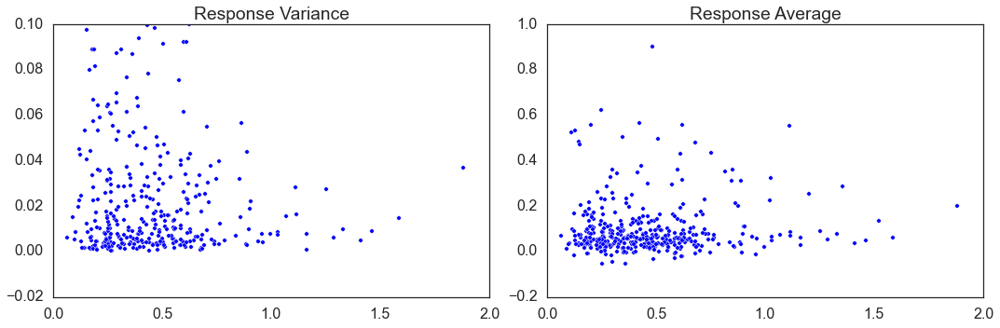

In [882]:
fig,(ax,ax2) = plt.subplots(1,2, sharex = True, figsize = (15,5))
ax.scatter(df[df.aligned==0].AveEucDisplacementNormed,df[df.aligned==0].ResponseVars)
ax.set_ylim(-.02,.1)
ax.set_xlim(0,2)
ax.set_title('Response Variance')

ax2.scatter(df[df.aligned==0].AveEucDisplacementNormed,df[df.aligned==0].ResponseAves)
ax2.set_title('Response Average')

fig.tight_layout()

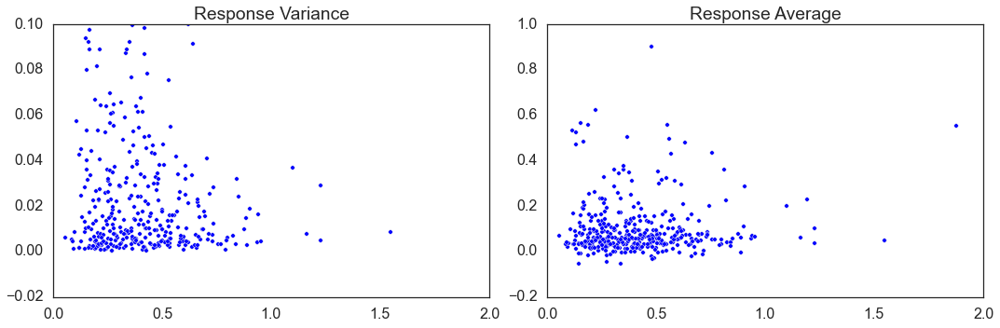

In [885]:
fig,(ax,ax2) = plt.subplots(1,2, sharex = True, figsize = (15,5))
ax.scatter(dfRaw[dfRaw.aligned==0].AveEucDisplacementNormed,dfRaw[dfRaw.aligned==0].ResponseVars)
ax.set_ylim(-.02,.1)
ax.set_xlim(0,2)
ax.set_title('Response Variance')

ax2.scatter(dfRaw[dfRaw.aligned==0].AveEucDisplacementNormed,dfRaw[dfRaw.aligned==0].ResponseAves)
ax2.set_title('Response Average')

fig.tight_layout()

(0, 1.5)

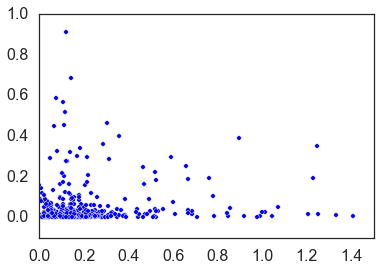

In [826]:
fig,ax = plt.subplots()
ax.scatter(df[df.aligned==1].AveEucDisplacementNormed,df[df.aligned==1].ResponseVars)
ax.set_ylim(-0.1,1)
ax.set_xlim(0,1.5)

<a id = 'plot displacement'></a>
## Plot ROI displacement before and after alignment for each cell. 
[back to top](#top) 

#### Raw Intensity

In [178]:
df.iplot(kind='scatter',mode='markers', x='unaligned', y='aligned', size=5, legend = False,
        title= 'Cross-Trial ROI Drift by Cell', xTitle = 'unaligned', yTitle = 'aligned')#, filename='cufflinks/simple-scatter')

#### Correlated Version

In [366]:
aligned = df.AveEucDisplacement[df.aligned==1]
unaligned = df.AveEucDisplacement[df.aligned==0]

In [367]:
aligned = aligned[aligned.apply(lambda x: x!='exclude')]

unaligned = unaligned[unaligned.apply(lambda x: x!='exclude')]

In [370]:
dfCorrplot = pd.DataFrame(dict(aligned=aligned, unaligned=unaligned))

In [379]:
x='unaligned', y='aligned'

In [1060]:

dfCorrplot.iplot(kind='scatter',mode='markers', keys=['unaligned','aligned'], size=5, legend = False,
        title= 'Cross-Trial ROI Drift by Cell: Corr version', xTitle = 'unaligned', yTitle = 'aligned', filename='cufflinks/scatter')

 Below i'm embedding an iframe html snippet for the plot generated above which is stored on the plotly server. I'm then hiding the code so that only the plot shows up.

<a id = 'FNCCroutine'></a>

In [351]:

def runFNCConCorr(mask, odor, cell, fnames, targetFname, key = 'current_statestep2/corrected' ):
    from sklearn.preprocessing import scale
    """
    We load the preprocessed red channel neighborhood for a cell-odor pair for all trials. We then calculate 
    the displacement of the peak from a reference trial across all other trials. 
    """
    
    odor = odor
    cell = cell

    a,b = scipy.ndimage.label(mask)
    coords = get_coords(mask, a, range(b+1))
    coords = [(t[1],t[0]) for t in coords]

    #Specify dimensions  of local neighborhood
    halfRad = 25
    yi = (coords[cell][1]-halfRad).astype(int)
    yf = (coords[cell][1]+halfRad).astype(int)
    xi = (coords[cell][0]-halfRad).astype(int)
    xf = (coords[cell][0]+halfRad).astype(int)
    
    #Edge Exception. Return's None for cells on the edge. 
    for _ in [yi, yf, xi,xf]:
        if _<0 or _>512:
            print 'Exception: ' 'cell {},'.format(cell), _, " neighborhood outside image"
            return 'exclude', 'exclude', 'exclude', 'exclude' 
    #Specify dimensions of target 
    xstart = 10
    ystart = 10
    targetW = 30
    targetH = 30
    
    #load target 
    epoch,trialID = [int(_) for _ in re.split('_e|_con|_',targetfname)[-3:-1]]
    odorFrames_i, odorFrames_f = odorInfo['epoch{}'.format(epoch)][trialID-1]['pre_odor_post_interval'][odor]
    with h5py.File(targetFname, 'r+') as f:    
        target = f[key][yi:yf,xi:xf, odorFrames_i:odorFrames_f] 
    #Correlate
    h,w,numFrames = target.shape
    corrWin = 2
    #scale each frame
    scaled = np.empty((h,w,numFrames))
    for i, frame in enumerate([scale(target[...,frame]) for frame in range(numFrames)]):
        scaled[...,i] = frame
    #Correlate    
    targetCorr = np.empty((h,w))
    for i in range(0,h):
        for j in range(0,w):
            targetCorr[i,j] = np.correlate(scaled[i,j,:],scaled[i-corrWin:i+corrWin, j-corrWin:j+corrWin,:].mean(0).mean(0))

        
    #Make actual target
    actualTarget = targetCorr[xstart:xstart+targetW, ystart:ystart+targetH]
    #actualTarget = actualTarget.mean(2)
    

    #Make Mask Overlay
    overlay = np.ma.MaskedArray(mask.astype(bool), np.invert(mask.astype(bool)).astype(bool))

    #Run target search on all trials
    scores = []
    argmax_coords = []
    EucDist = []    
    for ifname, fname in enumerate(fnames):
        epoch,trialID = [int(_) for _ in re.split('_e|_con|_',fname)[-3:-1]]
        #get odor Info
        odorFrames_i, odorFrames_f = odorInfo['epoch{}'.format(epoch)][trialID-1]['pre_odor_post_interval'][odor]

        #Load trial neighborhood
        with h5py.File(fname, 'r+') as f:    
            trial = f[key][yi:yf,xi:xf, odorFrames_i:odorFrames_f]
        #Correlate
        h,w,numFrames = trial.shape
        corrWin = 2
        #scale each frame
        scaled = np.empty((h,w,numFrames))
        for i, frame in enumerate([scale(trial[...,frame]) for frame in range(numFrames)]):
            scaled[...,i] = frame
        #Correlate    
        trial = np.empty((h,w))
        for i in range(0,h):
            for j in range(0,w):
                trial[i,j] = np.correlate(scaled[i,j,:],scaled[i-corrWin:i+corrWin, j-corrWin:j+corrWin,:].mean(0).mean(0))
        #fix NAN values
        trial=np.nan_to_num(trial)
        trial[trial==0] = trial[corrWin:,corrWin].flatten().mean()
        #Execute Fast normalized cross-correlation
        result = match_template(trial, actualTarget)
#         if ifname ==1:
#             return trial, actualTarget

        #Obtain correlation values
        i,j = np.unravel_index(np.argmax(result),result.shape)
        scores.append(result[i,j])
        argmax_coords.append((i,j))
        
        #Obtain average Euclidian distance
        from scipy.spatial import distance
        EucDist.append(distance.pdist(np.array([(10,10),(i,j)]),'euclidean'))
    AveEucDisplacement = np.vstack(EucDist).mean()
    return scores, argmax_coords, EucDist, AveEucDisplacement

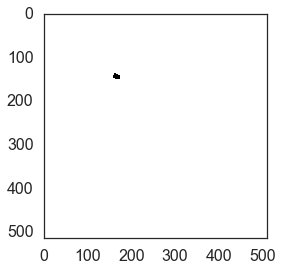

In [987]:
plt.imshow(mask==90)

In [246]:

def runFNCC(mask, odor, cell, fnames, targetFname, key = 'current_statestep2/corrected' ):
    """
    We load the preprocessed red channel neighborhood for a cell-odor pair for all trials. We then calculate 
    the displacement of the peak from a reference trial across all other trials. 
    """
    
    odor = odor
    cell = cell

    a,b = scipy.ndimage.label(mask)
    coords = get_coords(mask, a, range(b+1))
    coords = [(t[1],t[0]) for t in coords]

    #Specify dimensions  of local neighborhood
    halfRad = 25
    yi = (coords[cell][1]-halfRad).astype(int)
    yf = (coords[cell][1]+halfRad).astype(int)
    xi = (coords[cell][0]-halfRad).astype(int)
    xf = (coords[cell][0]+halfRad).astype(int)
    
    #Edge Exception. Return's None for cells on the edge. 
    for _ in [yi, yf, xi,xf]:
        if _<0 or _>512:
            print 'Exception: ' 'cell {},'.format(cell), _, " neighborhood outside image"
            return 'exclude', 'exclude', 'exclude', 'exclude' 
    #Specify dimensions of target 
    xstart = 10
    ystart = 10
    targetW = 30
    targetH = 30
    
    #load target 
    epoch,trialID = [int(_) for _ in re.split('_e|_con|_',targetfname)[-3:-1]]
    odorFrames_i, odorFrames_f = odorInfo['epoch{}'.format(epoch)][trialID-1]['pre_odor_post_interval'][odor]
    with h5py.File(targetFname, 'r+') as f:    
        target = f[key][yi:yf,xi:xf, odorFrames_i:odorFrames_f]  
        
    #Make actual target
    actualTarget = target[xstart:xstart+targetW, ystart:ystart+targetH]
    actualTarget = actualTarget.mean(2)


    #Make Mask Overlay
    overlay = np.ma.MaskedArray(mask.astype(bool), np.invert(mask.astype(bool)).astype(bool))

    #Run target search on all trials
    scores = []
    argmax_coords = []
    EucDist = []    
    for fname in fnames:
        epoch,trialID = [int(_) for _ in re.split('_e|_con|_',fname)[-3:-1]]
        #get odor Info
        odorFrames_i, odorFrames_f = odorInfo['epoch{}'.format(epoch)][trialID-1]['pre_odor_post_interval'][odor]

        #Load trial neighborhood
        with h5py.File(fname, 'r+') as f:    
            trial = f[key][yi:yf,xi:xf, odorFrames_i:odorFrames_f].mean(2)

        #Execute Fast normalized cross-correlation
        result = match_template(trial, actualTarget)


        #Obtain correlation values
        i,j = np.unravel_index(np.argmax(result),result.shape)
        scores.append(result[i,j])
        argmax_coords.append((i,j))

        #Obtain average Euclidian distance
        from scipy.spatial import distance
        EucDist.append(distance.pdist(np.array([(10,10),(i,j)]),'euclidean'))
    AveEucDisplacement = np.vstack(EucDist).mean()
    return scores, argmax_coords, EucDist, AveEucDisplacement

<a id = 'FNCCdebug'></a>
## Debugging

[back to top](#top)

In [354]:
this = runFNCC(mask, odor, cell, fnames, targetFname, key = 'current_statestep2/corrected' )

In [216]:
odor = 3
cell = 202

a,b = scipy.ndimage.label(mask)
coords = get_coords(mask, a, range(b+1))
coords = [(t[1],t[0]) for t in coords]

#Specify dimensions  of local neighborhood
halfRad = 25
yi = (coords[cell][1]-halfRad).astype(int)
yf = (coords[cell][1]+halfRad).astype(int)
xi = (coords[cell][0]-halfRad).astype(int)
xf = (coords[cell][0]+halfRad).astype(int)

#Specify dimensions of target 
xstart = 10
ystart = 10
targetW = 30
targetH = 30

#Make actual target
actualTarget = target[xstart:xstart+targetW, ystart:ystart+targetH]
actualTarget = actualTarget.mean(2)


#Make Mask Overlay
overlay = np.ma.MaskedArray(mask.astype(bool), np.invert(mask.astype(bool)).astype(bool))


#load target 
epoch,trialID = [int(_) for _ in re.split('_e|_con|_',targetfname)[-3:-1]]
odorFrames_i, odorFrames_f = odorInfo['epoch{}'.format(epoch)][trialID-1]['pre_odor_post_interval'][odor]
with h5py.File(targetFname, 'r+', ) as f:    
    target = f['current_statestep2/corrected'][yi:yf,xi:xf, odorFrames_i:odorFrames_f]  

#Run target search on all trials
scores = []
argmax_coords = []
EucDist = []    
for fname in fnames:
    epoch,trialID = [int(_) for _ in re.split('_e|_con|_',fname)[-3:-1]]
    #get odor Info
    odorFrames_i, odorFrames_f = odorInfo['epoch{}'.format(epoch)][trialID-1]['pre_odor_post_interval'][odor]

    #Load trial neighborhood
    with h5py.File(fname, 'r+', ) as f:    
        trial = f['current_statestep2/corrected'][yi:yf,xi:xf, odorFrames_i:odorFrames_f].mean(2)

    #Execute Fast normalized cross-correlation
    result = match_template(trial, actualTarget)
    

    #Obtain correlation values
    i,j = np.unravel_index(np.argmax(result),result.shape)
    scores.append(result[i,j])
    argmax_coords.append((i,j))
    
    #Obtain average Euclidian distance
    from scipy.spatial import distance
    EucDist.append(distance.pdist(np.array([(10,10),(i,j)]),'euclidean'))
AveEucDisplacement = np.vstack(EucDist).mean()

In [217]:
ave = np.asarray(scores).mean()
sigma_2 = np.std(np.asarray(scores))

print ave, sigma_2
print scores
print AveEucDisplacement

0.807144 0.11051
[0.99999601, 0.92636311, 0.91109389, 0.96471018, 0.93042082, 0.95125854, 0.9103756, 0.90733927, 0.82965374, 0.91277301, 0.90875661, 0.85637367, 0.88713646, 0.84705675, 0.78847444, 0.8100608, 0.71609098, 0.77900743, 0.73147041, 0.63690865, 0.73811841, 0.58007663, 0.62711924, 0.68022358, 0.70092684, 0.61824107, 0.74713433, 0.78835374, 0.78596598, 0.7804206, 0.76957601]
0.639626681443


In [218]:
scipy.ndimage.measurements.extrema?

In [ ]:
ave = np.asarray(scores).mean()
sigma_2 = np.std(np.asarray(scores))

print ave, sigma_2
print scores
print AveEucDisplacement

<a id = 'configure'></a>
### Configure Notebook
[back to top](#top)

In [2]:

import sys
sys.path.append('/users/stan/documents/')
import os
from glob import glob
import copy
import numpy as np

from d_code.imaging.io import tifffile
import matplotlib.pylab as plt
from joblib import Parallel, delayed
from collections import defaultdict
from scipy import signal
from time import time
import cPickle as pickle
import spUtils
import seaborn as sns
import h5py
import re
import graphlab as gl
gl.canvas.set_target('ipynb')
import pandas as pd

sns.set_palette("husl")
sns.set_style("white")
sns.set_context("poster")


%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

#style notebook
from IPython.core.display import HTML
import urllib2
HTML(urllib2.urlopen('http://bit.ly/1Bf5Hft').read())

In [1061]:
import plotly
from plotly.graph_objs import *
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot
init_notebook_mode() # run at the start of every ipython notebook to use plotly.offline
                     # this injects the plotly.js source files into the notebook
    #combine all with seaborn and pandas. 
import cufflinks as cf
cf.go_offline()

In [435]:
cf2.set_config_file(offline =True, offline_show_link=True)

In [438]:
dfCorrplot.iplot?

Using cufflinks, we can plot our dataframe and return it as a plotly compativle figure. We can then Embed as Html using plotly.offline.plot. which will save this locally as a file that can be emailed, etc. 

In [1125]:
unaligned = dfRaw[dfRaw.aligned==0].AveEucDisplacementNormed

aligned = dfRaw[dfRaw.aligned==1].AveEucDisplacementNormed

test = pd.DataFrame(dict(aligned = aligned, unaligned = unaligned))

In [1126]:

fig = test.iplot(kind='scatter',mode='markers', keys=['unaligned','aligned'], size=5, legend = False,
title= 'Average ROI Displacement Across Trials: Intensity Projection', xTitle = 'ROIs', yTitle = 'fraction of roi radius',dimensions=(900, 600), asFigure=True)

In [1127]:
plotly.offline.plot(fig, filename='normedScatter')

'file:///Users/Stan/Dropbox/IPythonNotebooks/sp112315a/normedScatter.html'

In [1122]:
dunaligned = df[df.aligned==0].AveEucDisplacementNormed

daligned = df[df.aligned==1].AveEucDisplacementNormed

dfCorrplot = pd.DataFrame(dict(aligned = daligned, unaligned = dunaligned))

In [1128]:

fig = dfCorrplot.iplot(kind='scatter',mode='markers', keys=['unaligned','aligned'], size=5, legend = False,
title= 'Average ROI Displacement Across Trials: Correlation Projection', xTitle = 'ROIs', yTitle = 'fraction of roi radius',dimensions=(900, 600), asFigure=True)

In [1129]:
plotly.offline.plot(fig, filename='dfCorrPlot')

'file:///Users/Stan/Dropbox/IPythonNotebooks/sp112315a/dfCorrPlot.html'

In [451]:
%%html
<iframe width="1200" height="800" frameborder="0" scrolling="no" src="dfCorrPlot.html"></iframe>